<a href="https://colab.research.google.com/github/Yiujin/Style_Transfer/blob/main/Image_Style_Transfer_Using_Convolutional_Neural_Networks_(CVPR_2016).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

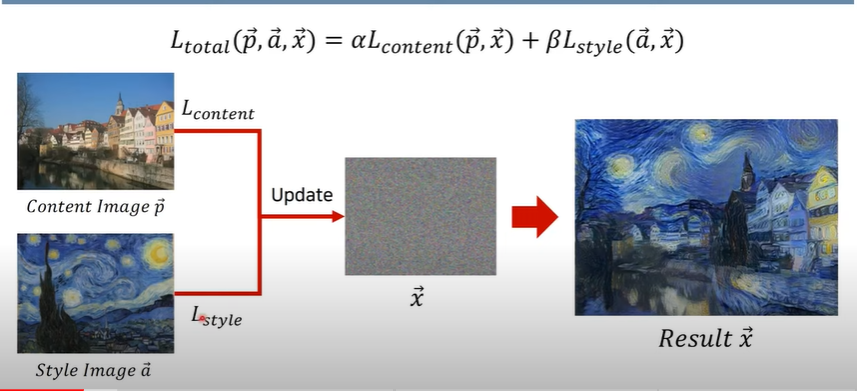

- 벡터 p로부터 이미지 content는 유지하도록 하는 content loss 

+ 벡터 a로부터 스타일을 비슷하게 하려는 style loss

 == 이미지 p에서 컨텐츠 가져오고 이미지 a 에서 스타일 가져오기 

 - content loass : 두 이미지 특징의 activation값이 동일하도록 만듬 : 특정 레이어에서 나온 같은 위치의 output feature자체가 동일하도록  

 - style loss :서로 다른 특징간의 상관관계를 의미 : 서로 다른 특징 = 채널의 갯수 
 상관관계는 하나의 feature에서 높은 activation이 나왔으면 다른 feature에서도 높은 activation이 나온다는 것  = feature i 와 feature j의 내적 (같은 위치에서의 값을 곱한 것을 다 더한것 ) --> gram matrix 만들어서 그 값 자체를 해당 이미지의 스타일이라고 봄 따라서 두 이미지의 gram matrix의 값을 비교해서 차이가 감소하도록(gram matrix를 유사하게) 만드는 것이 style loss 가 하는 일

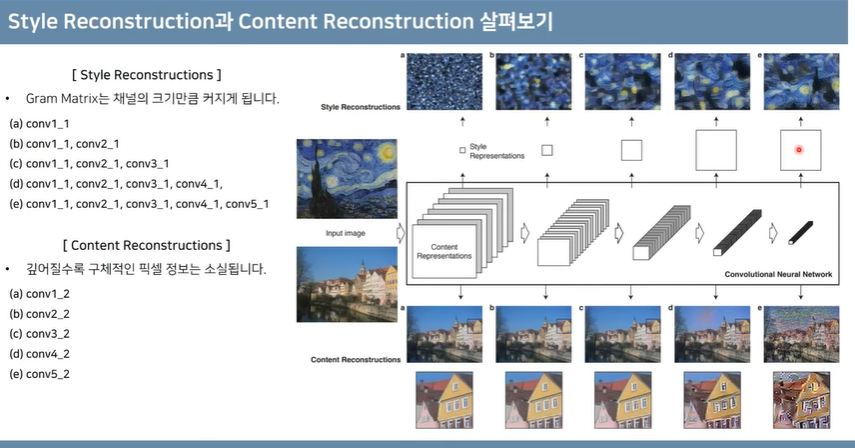

- style loss : 여러개의 layer에 대해서 같이 사용 : 깊은 레이어까지 같이 사용했을때 화풍을 더 잘 받아옴 
// 앞쪽 레이어일수록 채널의 갯수는 작고 h, w는 큼 -->  뒤로 갈수록 각 레이어의 아웃풋으로 나온 feature map의 크기가 커지면서 gram matrix도 함께 커짐

- content loss : 특정 레이어 하나만 설정해서 그 레이어의 아웃풋으로 나온 feature 값이 같아지도록 update --> 앞쪽에 있는 convoliution 레이어에 대해 feature 값이 같아지도록 update할수록 원본 이미지의 content를 더 잘 보존함 (깉은 레이어에 대해 feature값이 같아지도록 update하면 content 잘 유지 안됨)

-위의 사진은 style reconstruction과 content reconstruction을 따로 수행한 결과 // 실제로는 함께 수행하기 떄문에 두 결과가 합쳐진 이미지가 나옴 

In [1]:
# 실습에 필요한 라이브러리 및 환경 설정
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.models as models

import PIL
import matplotlib.pyplot as plt

import copy

In [2]:
# gpu 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [3]:
# 이미지를 불러와 다운받고 tensor로 변환
def image_loader(img_path, imsize):
    loader = transforms.Compose([
        transforms.Resize(imsize),
        transforms.ToTensor(),
    ])

    image = PIL.Image.open(img_path)
    # 네트워크 입력에 들어갈 이미지에 배치 목적의 차원 추가
    # torch.unsqueeze(input, dim) → Tensor
    # Returns a new tensor with a dimension of size one inserted at the specified position.
    # The returned tensor shares the same underlying data with this tensor.
    image = loader(image).unsqueeze(0)
    return image.to(device, torch.float)  

# torch.tensor형태의 이미지ㅡㄹ 화면에 출력하는 함수
def imshow(tensor):
    # matplotlib은 cpu기반이므로 cpu로 옮기기
    image = tensor.cpu().clone()
    # 배치 차원 제거
    image = image.squeeze(0)
    # PIL 객체로 변경
    image = transforms.ToPILImage()(image)
    # 이미지 화면에 출력(matplotlib는 [0.1]사이의 값이라고 해도 정상적으로 처리
    plt.imshow(image)
    plt.show()

In [97]:
# 저장소의 소스코드를 다운로드하여 실습용 이미지 준비
# !git clone https://github.com/ndb796/Deep-Learning-Paper-Review-and-Practice
# %cd Deep-Learning-Paper-Review-and-Practice

!git clone https://github.com/Yiujin/Style_Transfer
%cd Style_Transfer

Cloning into 'Style_Transfer'...
remote: Enumerating objects: 17, done.
remote: Counting objects: 100% (17/17), done.
remote: Compressing objects: 100% (15/15), done.
remote: Total 17 (delta 2), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (17/17), done.
/content/Deep-Learning-Paper-Review-and-Practice/Style_Transfer/Style_Transfer/Style_Transfer


## image reconstruction
 - 이미지를 최적화(optimization)한다는 것은 특정 손실값을 낮추는 방향으로 이미지를 업데이트 하는것 
 - MSE loss를 이용해 임의의 노이즈를 특정한 이미지로 변환

In [78]:
# 목표이미지 불러오기
img_path = './code_practices/images/cat.jpg'
target_image = image_loader(img_path, (512, 512))
imshow(target_image)

FileNotFoundError: ignored

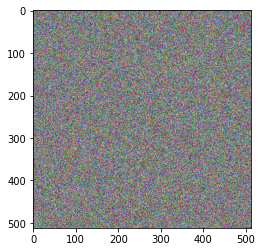

In [6]:
# 동일한 크기의 노이즈 이미지 준비
noise = torch.empty_like(target_image).uniform_(0,1).to(device)
imshow(noise)

start


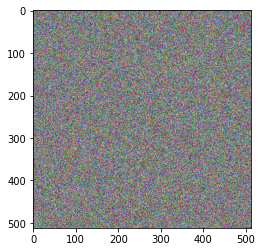

[Step : 10]
[Loss : 0.10408532619476318]


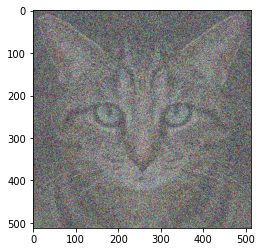

[Step : 20]
[Loss : 0.06217826530337334]


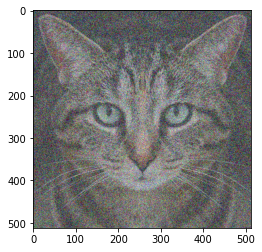

[Step : 30]
[Loss : 0.03714391216635704]


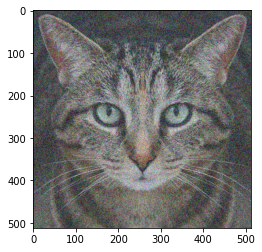

[Step : 40]
[Loss : 0.0221889466047287]


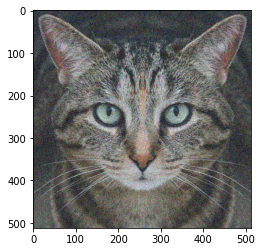

[Step : 50]
[Loss : 0.013255181722342968]


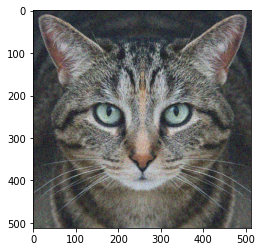

[Step : 60]
[Loss : 0.007918350398540497]


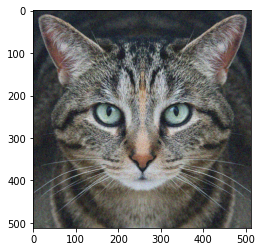

[Step : 70]
[Loss : 0.0047302464954555035]


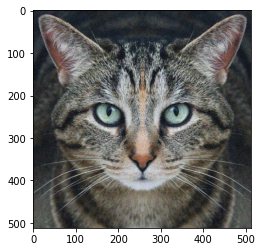

[Step : 80]
[Loss : 0.0028257439844310284]


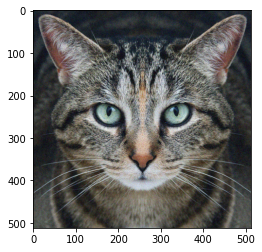

[Step : 90]
[Loss : 0.0016880366019904613]


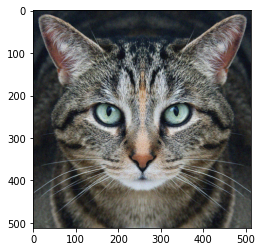

[Step : 100]
[Loss : 0.0010083955712616444]


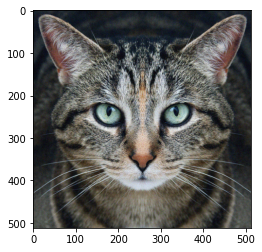

In [7]:
loss = nn.MSELoss()
iters = 100 # 반복 횟수 
lr = 1e4

print("start")
imshow(noise)

for i in range(iters):
    # required_grad 속성의 값을 True로 설정하여 해당 torch.Tensor의 연산을 추적
    noise.requires_grad = True

    # 손실함수에 대하여 미분하여 기울기(gradient) 계산
    output = loss(noise, target_image)
    output.backward()

    # 계산된 기울기를 이용하여 손실함수가 감소하는 방향으로 업데이트
    gradient = lr * noise.grad
    # 결과적으로 노이즈의 각 픽셀릐 값이 [-eps, eps] 사이의 값이 되도록 자르기
    # torch.clamp(input, min, max, *, out=None) → Tensor
    # Clamp all elements in input into the range [ min, max ]. Let min_value and max_value be min and max, respectively, this returns:
    # min보다 작은 값은  min으로, max보다 큰 값은 max로 변경
    noise = torch.clamp(noise-gradient, min = 0, max = 1).detach_() # 연산을 추척하는 것을 중단하기 위해 detach 호출

    if (i+1) % 10 == 0:
        print(f'[Step : {i+1}]')
        print(f'[Loss : {output}]')
        imshow(noise)

## 이미지 불러오기 
- 고흐의 그림과 건물 사진

[Content image]


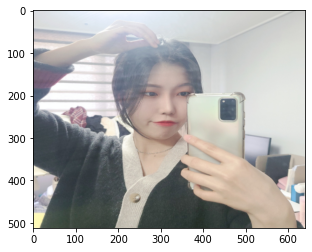

[Style] image]


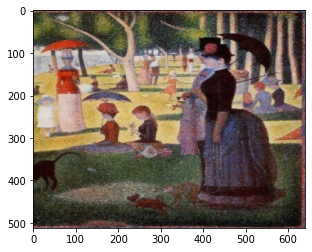

In [98]:
# 콘텐츠(content) 이미지와 스타일(style)이미지를 모두 준비
# content_img = image_loader('./code_practices/images/content_img_1.jpg', (512,640))
# style_img = image_loader('./code_practices/images/style_img_1.jpg', (512,640))

content_img = image_loader('./image/content2.jpg', (512,640))
style_img = image_loader('./image/style2.jpg', (512,640))

print('[Content image]')
imshow(content_img)
print('[Style] image]')
imshow(style_img)

## CNN 네트워크 불러오기 
- 특징 추출기(feature extractor)로 VGG 네트워크를 사용합니다

In [99]:
# 뉴럴 네트워크 모델 불러오기
# eval로 설정해서 test모드로 이미지 넣은 다음 feature 값 얻기
# 분류 목적이 아닌 feature를 얻기 위한 목적으로 사용하므로 features에만 접근하도록 함
cnn = models.vgg19(pretrained=True).features.to(device).eval() 
print(cnn)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

In [100]:
# vggnet은 학습시킬때 입력을 정규화한 형태로 받기 때문에 
# 마찬가지로 입력 정규화(Normalization)을 위한 초기화
cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225]).to(device)

class Normalization(nn.Module):
    def __init__(self, mean, std):
        super(Normalization, self).__init__()
        self.mean = mean.clone().view(-1,1,1)
        self.std = std.clone().view(-1,1,1)

    def forward(self, img):
        return (img - self.mean)/ self.std


## Style Reconstruction
- 임의의 노이즈가 특정한 이미지의 스타일을 가지도록 변환
- style_layers 리스트 변수의 값을 조절하여 어떤 레이어를 이용할지 설정가능


In [101]:
def gram_matrix(input):
    # a는 배치크기 , b는 특징 맵의 개수, (c,d)는 특징맵의 차원을 의미
    a,b,c,d = input.size()
    # 논문에서는 i = 특징 맵의 개수, j = 각 위치(position)
    features = input.view(a*b, c*d)
    # 행렬 곱으로 한번에 gram 내적 가능
    G = torch.mm(features, features.t()) # 전치와 내적하면 gram matrix와 동일ef gram_matrux(input):
    return G.div(a*b*c*d)

# 스타일 loss 계산을 위한 클래스 정의
class StyleLoss(nn.Module):
    def __init__(self, target_feature):
        super(StyleLoss, self).__init__()
        self.target = gram_matrix(target_feature).detach()

    def forward(self, input):
        G = gram_matrix(input)
        self.loss = F.mse_loss(G, self.target) #input의 gram matrix와 target의 gram matrix를 비교하여 loss 계산
        return input

In [102]:
# conv_5 : 10번째 layer 에 해당 // 원 논문의 layer 구성과는 다름 conv_5 : 10번째 layer 에 해당 // 원 논문의 layer 구성과는 다름
style_layers = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']

# style loss 값을 계산
def get_style_losses(cnn, style_img, noise_img):
    cnn = copy.deepcopy(cnn)
    normalization = Normalization(cnn_normalization_mean, cnn_normalization_std).to(device)
    style_losses = []

    # 가장 먼저 입력 이미지가 입력 정규화를 수행
    model = nn.Sequential(normalization)

    # 현재 CNN 모델에 포함되어 있는 모든 레이어를 확인
    i = 0
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i +=1
            name = 'conv_{}'.format(i)
        elif isinstance(layer, nn.ReLU):
            name = 'relu_{}'.format(i)
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            name = 'pool_{}'.format(i)
        elif isinstance(layer, nn.BatchNorm2d):
            name = 'bn_{}'.format(i)
        else:
            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

        model.add_module(name, layer)

        if name in style_layers:
            target_feature = model(style_img).detach()
            style_loss = StyleLoss(target_feature)
            model.add_module('style_loss_{}'.format(i), style_loss)
            style_losses.append(style_loss)

    # 마지막 style loss 이후의 레이어는 사용하지 않도록 i 변수에 마지막 레이어에 대한 위치 기록
    for i in range(len(model)-1, -1, -1):
        if isinstance(model[i], StyleLoss):
            break

    model = model[:(i+1)]
    return model, style_losses

In [103]:
def style_reconstruction(cnn, style_img, input_img, iters):
    model, style_losses = get_style_losses(cnn, style_img, input_img) # 압축된 모델과 style loss에 대하 정보 구함
    print(model)
    optimizer = optim.LBFGS([input_img.requires_grad_()])

    print('Start')
    imshow(input_img)

    # 하나의 값만 이용하기 위해 배열 형태로 사용
    run = [0]
    while run[0] <= iters:

        def closure():
            input_img.data.clamp_(0.1) # input image가 image 범위를 벗어나지 않게 clamp로 잘라줌

            optimizer.zero_grad()
            model(input_img)
            style_score = 0

            for sl in style_losses:
                style_score += sl.loss

            # print(style_score, type(style_score))
            style_score *= 1e6 # style loss는 값이 작을 수 있기 때문에 특정 가중치만큼 곱해주기
            style_score.backward()

            run[0] +=1
            if run[0] % 50 ==0:
                print(f'[Step : {run[0]} / Style Loss : {style_score.item()}]')
                imshow(input_img)

            return style_score
        
        optimizer.step(closure)

    # 결과적으로 이미지의 각 픽셀의 값이 [0, 1] 사이의 갑이 되도록 자르기
    input_img.data.clamp_(0,1)

    return input_img

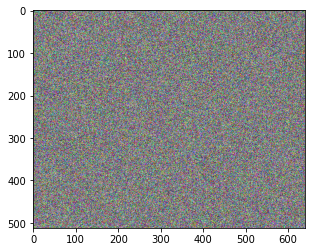

In [104]:
# 콘텐츠 이미지와 동일한 크기의 노이즈 이미지 준비
input_img = torch.empty_like(content_img).uniform_(0,1).to(device)
imshow(input_img)

Sequential(
  (0): Normalization()
  (conv_1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (style_loss_1): StyleLoss()
  (relu_1): ReLU()
  (conv_2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (style_loss_2): StyleLoss()
  (relu_2): ReLU()
  (pool_2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv_3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (style_loss_3): StyleLoss()
  (relu_3): ReLU()
  (conv_4): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (style_loss_4): StyleLoss()
  (relu_4): ReLU()
  (pool_4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv_5): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (style_loss_5): StyleLoss()
)
Start


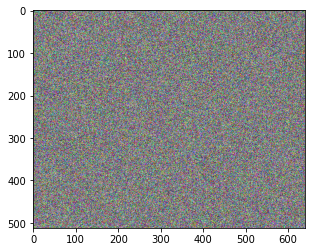

[Step : 50 / Style Loss : 117.6769790649414]


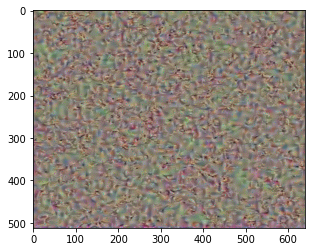

[Step : 100 / Style Loss : 50.06390380859375]


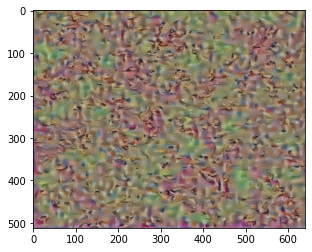

[Step : 150 / Style Loss : 38.88315963745117]


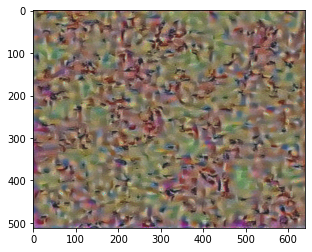

[Step : 200 / Style Loss : 19.342769622802734]


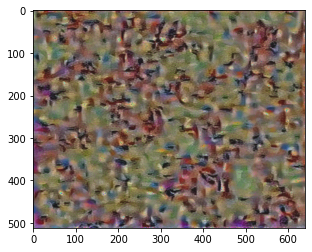

[Step : 250 / Style Loss : 12.56374740600586]


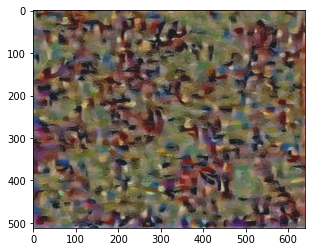

[Step : 300 / Style Loss : 8.905838966369629]


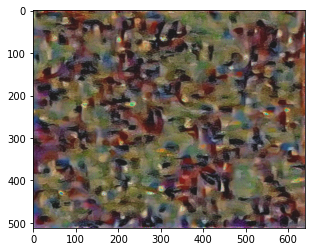

In [105]:
# style reconstruction  수행
output = style_reconstruction(cnn,style_img = style_img, input_img = input_img, iters = 300)

##Content Reconstrauction 
- 임의의 노이즈가 특정한 이미지의 콘텐츠를 가지도록 변환

In [106]:
# Content loss 계산을 위한 클래스
class ContentLoss(nn.Module):
    def __init__(self, target,):
        super(ContentLoss, self).__init__()
        self.target = target.detach()

    def forward(self, input):
        self.loss = F.mse_loss(input, self.target) # 두개의 feature 에 대해 단순히 두값이 유사해지도록 update
        return input

In [107]:
# 논문에서는 content가 특정한 feature layer에 대해서만 content loss 를 구 논문에서는 content가 특정한 feature layer에 대해서만 content loss 를 구하도록 설정
content_layers = ['conv_4']

# content loss 를 계산하는 함수
def get_content_losses(cnn, content_img, noise_image):
    cnn = copy.deepcopy(cnn)
    normalization = Normalization(cnn_normalization_mean, cnn_normalization_std).to(device)
    content_losses = []

    # 가장 먼저 입력 이미지가 입력 정규화를 수행
    model = nn.Sequential(normalization)

    # 현재 CNN 모델에 포함되어 있는 모든 레이어 확인
    i = 0
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i +=1
            name = 'conv_{}'.format(i)
        elif isinstance(layer, nn.ReLU):
            name = 'relu_{}'.format(i)
            layer = nn.ReLU(inplace=True)
        elif isinstance(layer, nn.MaxPool2d):
            name = 'pool_{}'.format(i)
        elif isinstance(layer, nn.BatchNorm2d):
            name = 'bn_{}'.format(i)
        else:
            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

        model.add_module(name, layer)

        if name in content_layers:
            target_feature = model(content_img).detach()
            content_loss = ContentLoss(target_feature)
            # print(content_loss)
            model.add_module('content_loss_{}'.format(i), content_loss)
            content_losses.append(content_loss)

    # 마지막 content loss 이후의 레이어는 사용하지 않도록 i 변수에 마지막 레이어에 대한 위치 기록
    for i in range(len(model)-1, -1, -1):
        if isinstance(model[i], ContentLoss):
            break

    model = model[:(i+1)]
    return model, content_losses

In [108]:
def content_reconstruction(cnn, content_img, input_img, iters):
    model, content_losses = get_content_losses(cnn, content_img, input_img) # 압축된 모델과 style loss에 대하 정보 구함
    print(model)
    optimizer = optim.LBFGS([input_img.requires_grad_()])

    print('Start')
    imshow(input_img)

    # 하나의 값만 이용하기 위해 배열 형태로 사용
    run = [0]
    while run[0] <= iters:

        def closure():
            input_img.data.clamp_(0.1) # input image가 image 범위를 벗어나지 않게 clamp로 잘라줌

            optimizer.zero_grad()
            model(input_img)
            content_score = 0

            for cl in content_losses:
                content_score += cl.loss

            # print(content_score, type(content_score))
            content_score.backward()

            run[0] +=1
            if run[0] % 50 ==0:
                print(f'[Step : {run[0]} / content Loss : {content_score.item()}]')
                imshow(input_img)

            return content_score
        
        optimizer.step(closure)

    # 결과적으로 이미지의 각 픽셀의 값이 [0, 1] 사이의 갑이 되도록 자르기
    input_img.data.clamp_(0,1)

    return input_img

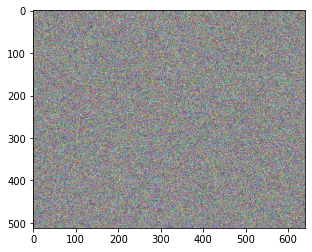

In [109]:
# 콘텐츠 이미지와 동일한 크기의 노이즈 이미지 준비
input_img = torch.empty_like(content_img).uniform_(0.1).to(device)
imshow(input_img)

Sequential(
  (0): Normalization()
  (conv_1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu_1): ReLU(inplace=True)
  (conv_2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu_2): ReLU(inplace=True)
  (pool_2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv_3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu_3): ReLU(inplace=True)
  (conv_4): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (content_loss_4): ContentLoss()
)
Start


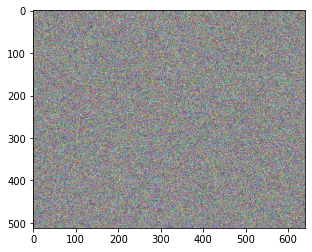

[Step : 50 / content Loss : 0.8115448355674744]


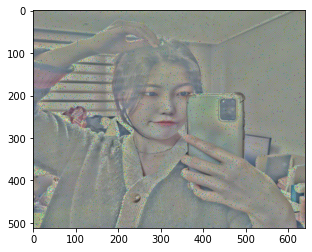

[Step : 100 / content Loss : 0.42540407180786133]


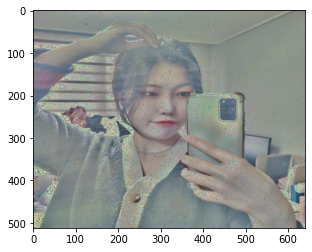

[Step : 150 / content Loss : 0.28644871711730957]


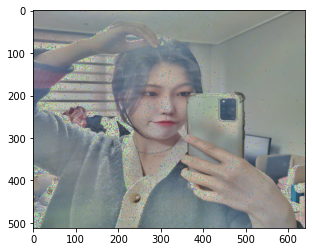

[Step : 200 / content Loss : 0.2109045833349228]


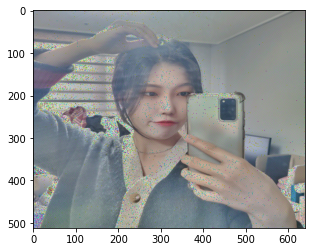

[Step : 250 / content Loss : 0.16488416492938995]


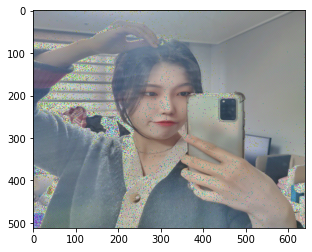

[Step : 300 / content Loss : 0.13292571902275085]


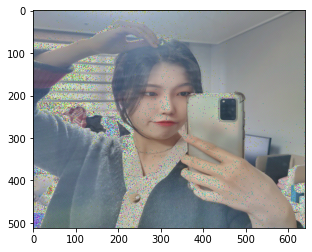

tensor([[[[0.5761, 0.7768, 0.6835,  ..., 0.5201, 0.2118, 0.1863],
          [0.5004, 0.3255, 0.7136,  ..., 0.6645, 0.0990, 1.0000],
          [0.6126, 0.6740, 0.5623,  ..., 0.4100, 0.2993, 0.9329],
          ...,
          [0.9951, 1.0000, 0.8236,  ..., 0.9059, 0.7966, 1.0000],
          [0.9690, 1.0000, 1.0000,  ..., 0.9833, 0.6421, 1.0000],
          [0.9395, 0.8583, 0.8597,  ..., 0.4697, 0.6680, 1.0000]],

         [[0.6245, 0.5119, 0.6713,  ..., 0.5409, 0.9270, 0.5660],
          [0.5567, 0.5477, 0.5016,  ..., 0.4129, 0.7734, 0.1267],
          [0.6511, 0.7468, 0.6645,  ..., 0.6030, 0.7555, 0.1574],
          ...,
          [0.9566, 1.0000, 1.0000,  ..., 0.8231, 0.7656, 0.7893],
          [1.0000, 0.6511, 0.9903,  ..., 0.8298, 1.0000, 0.5995],
          [1.0000, 1.0000, 1.0000,  ..., 0.5131, 0.9822, 0.7807]],

         [[0.1314, 0.6652, 0.3761,  ..., 0.4961, 0.1035, 0.3271],
          [1.0000, 1.0000, 0.9077,  ..., 0.5035, 0.4476, 0.6808],
          [0.3666, 0.3213, 0.4803,  ..., 0

In [110]:
content_reconstruction(cnn, content_img = content_img, input_img=input_img, iters = 300)

## Style Transfer 
- Content loss 와 Style loss 함께 이용하여 Style Transfer 진행

In [111]:
content_layers = ['conv_4']
style_layers = ['conv_1', 'conv_3', 'conv_5', 'conv_7', 'conv_9'] # 원 논문과 비슷한 결과 위해 조금 더 뒤쪽에 있는 layer 사용

# Style Transfer loss 를 계산하는 함수
def get_losses(cnn, content_img, style_img, noise_img):
    cnn = copy.deepcopy(cnn)
    normalization = Normalization(cnn_normalization_mean, cnn_normalization_std).to(device)
    content_losses = []
    style_losses = []

    model = nn.Sequential(normalization)

    # 현재 CNN 모델에 포함되어 있는 모든 레이어 확인
    i = 0
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i +=1
            name = 'conv_{}'.format(i)
        elif isinstance(layer, nn.ReLU):
            name = 'relu_{}'.format(i)
            layer = nn.ReLU(inplace=False) #강의에서는 True / RunTimeError로 false 로 바꿈 
        elif isinstance(layer, nn.MaxPool2d):
            name = 'pool_{}'.format(i)
        elif isinstance(layer, nn.BatchNorm2d):
            name = 'bn_{}'.format(i)
        else:
            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

        model.add_module(name, layer)

        if name in content_layers:
            target_feature = model(content_img).detach()
            content_loss = ContentLoss(target_feature)
            model.add_module('content_loss_{}'.format(i), content_loss)
            content_losses.append(content_loss)

        if name in style_layers:
            target_feature = model(style_img).detach()
            style_loss = StyleLoss(target_feature)
            model.add_module('style_loss_{}'.format(i), style_loss)
            style_losses.append(style_loss)

    # 마지막 content loss 이후의 레이어는 사용하지 않도록 i 변수에 마지막 레이어에 대한 위치 기록
    for i in range(len(model)-1, -1, -1):
        if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
            break

    model = model[:(i+1)]
    return model, content_losses, style_losses

In [112]:
def style_transfer(cnn, content_img,style_img ,input_img, iters):
    model, content_losses, style_losses = get_losses(cnn, content_img,style_img, input_img) # 압축된 모델과 style loss에 대하 정보 구함
    optimizer = optim.LBFGS([input_img.requires_grad_()])

    print('Start')
    imshow(input_img)

    # 하나의 값만 이용하기 위해 배열 형태로 사용
    run = [0]
    while run[0] <= iters:

        def closure():
            input_img.data.clamp_(0.1) # input image가 image 범위를 벗어나지 않게 clamp로 잘라줌

            optimizer.zero_grad()
            model(input_img)
            content_score = 0
            style_score = 0

            for cl in content_losses:
                content_score += cl.loss
            for sl in style_losses:
                style_score += sl.loss

            style_score *= 1e5 # content loss는 앖이 작을 수 있기 때문에 특정 가중치만큼 곱해주기
            loss = content_score + style_score
            loss.backward()

            run[0] +=1
            if run[0] % 50 ==0:
                print(f'[Step : {run[0]} / content Loss : {content_score.item()} / style loss : {style_score.item()}]')
                imshow(input_img)

            return content_score + style_score
        
        optimizer.step(closure)

    # 결과적으로 이미지의 각 픽셀의 값이 [0, 1] 사이의 갑이 되도록 자르기
    input_img.data.clamp_(0,1)

    return input_img

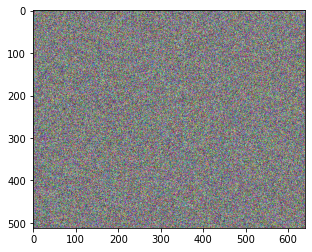

In [113]:
input_img = torch.empty_like(content_img).uniform_(0,1).to(device)
imshow(input_img)

Start


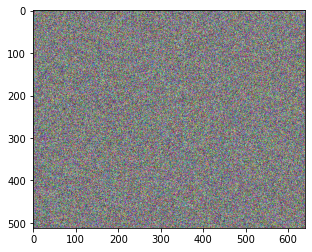

[Step : 50 / content Loss : 19.056547164916992 / style loss : 40.46455001831055]


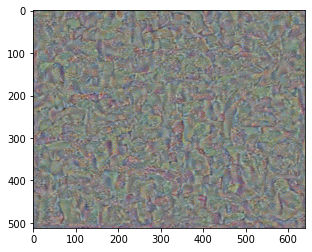

[Step : 100 / content Loss : 16.821447372436523 / style loss : 16.169023513793945]


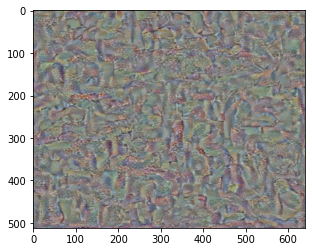

[Step : 150 / content Loss : 15.534167289733887 / style loss : 9.973044395446777]


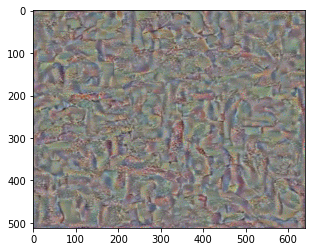

[Step : 200 / content Loss : 14.248504638671875 / style loss : 7.39653205871582]


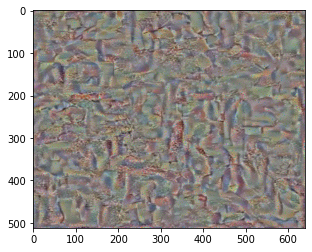

[Step : 250 / content Loss : 12.98192310333252 / style loss : 5.76045036315918]


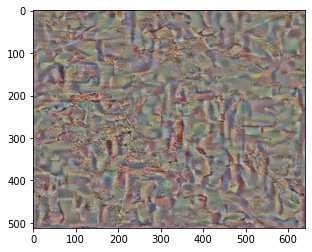

[Step : 300 / content Loss : 11.828807830810547 / style loss : 4.619208335876465]


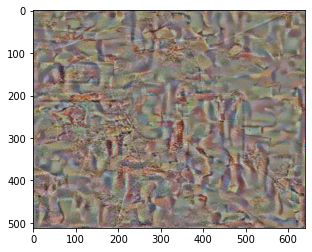

[Step : 350 / content Loss : 10.891179084777832 / style loss : 3.897826910018921]


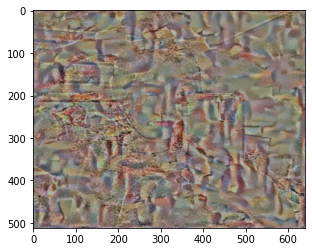

[Step : 400 / content Loss : 10.082717895507812 / style loss : 3.427170753479004]


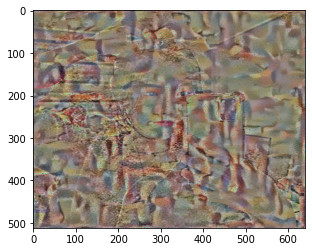

[Step : 450 / content Loss : 9.467782020568848 / style loss : 3.061119794845581]


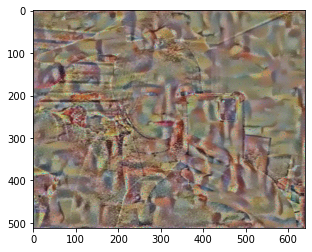

[Step : 500 / content Loss : 8.922243118286133 / style loss : 2.7732229232788086]


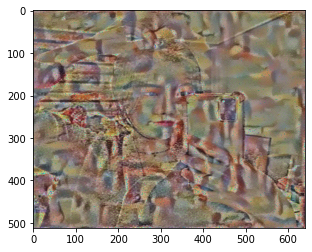

[Step : 550 / content Loss : 8.467119216918945 / style loss : 2.5122196674346924]


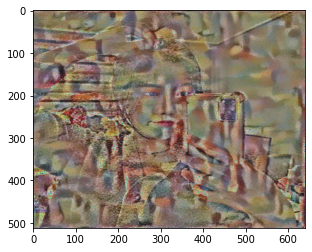

[Step : 600 / content Loss : 8.108072280883789 / style loss : 2.3061320781707764]


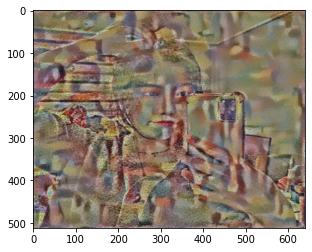

[Step : 650 / content Loss : 7.80597448348999 / style loss : 2.143296718597412]


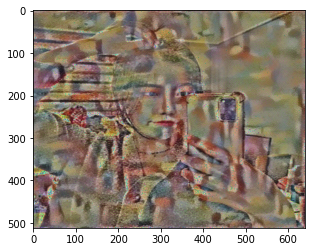

[Step : 700 / content Loss : 7.543679237365723 / style loss : 2.093968629837036]


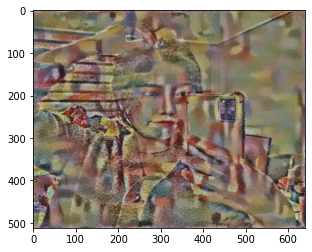

[Step : 750 / content Loss : 7.371219635009766 / style loss : 1.8415846824645996]


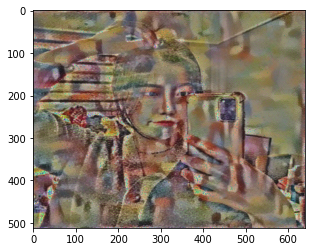

[Step : 800 / content Loss : 7.199015140533447 / style loss : 1.7182121276855469]


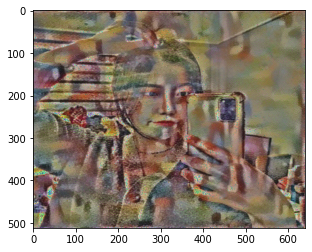

[Step : 850 / content Loss : 7.084743022918701 / style loss : 1.611097812652588]


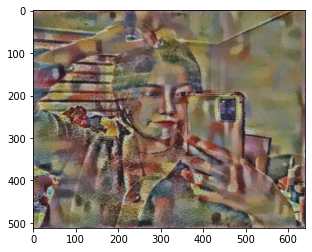

[Step : 900 / content Loss : 6.948005676269531 / style loss : 1.5098974704742432]


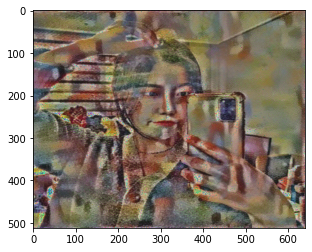

In [114]:
# style transfer 수행
output = style_transfer(cnn, content_img=content_img, style_img = style_img,input_img=input_img, iters = 900)


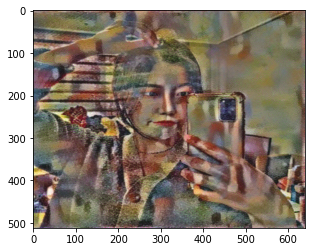

In [116]:
imshow(output)